<a href="https://colab.research.google.com/github/solar-node/ML/blob/main/IISCtask2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Image Transformations and Keypoint Matching Using SIFT

- This project involves several image transformations, including scaling (resizing), rotation, translation, and shearing. Additionally, it employs the SIFT (Scale-Invariant Feature Transform) algorithm to detect keypoints between the original image and the transformed images. The project concludes with another use case of SIFT to demonstrate its versatility and effectiveness in image analysis.

In [34]:
## Links for images used below:

# Atomic_habits.jpg - https://drive.google.com/file/d/1eJiIBF7SyJc5ZoxbuAqtW_DZYdY_W0yW/view?usp=drive_link
# birds.webp - https://drive.google.com/file/d/1xG7GXJRHuRXZ944N1Glegzf5h3USs-I6/view?usp=drive_link
# cat.jpg - https://drive.google.com/file/d/1pi-1LMehB2CaAGZeQiaG7r0FbOjtU-0l/view?usp=drive_link
# Tower.jpg - https://drive.google.com/file/d/1pi-1LMehB2CaAGZeQiaG7r0FbOjtU-0l/view?usp=drive_link
# Intellegent_investor.webp - https://drive.google.com/file/d/1N2oPOMRbhLuDM6IBPvENHmxAZ6S3-8MR/view?usp=drive_link
# LotOfBooks.jpeg - https://drive.google.com/file/d/1T1ZvyfYeONNe9yr-DH-odNSfRwJxwslL/view?usp=drive_link

# Importing necessary libraries

import cv2
import numpy as np
from google.colab.patches import cv2_imshow


##  1. Scaling Transformation

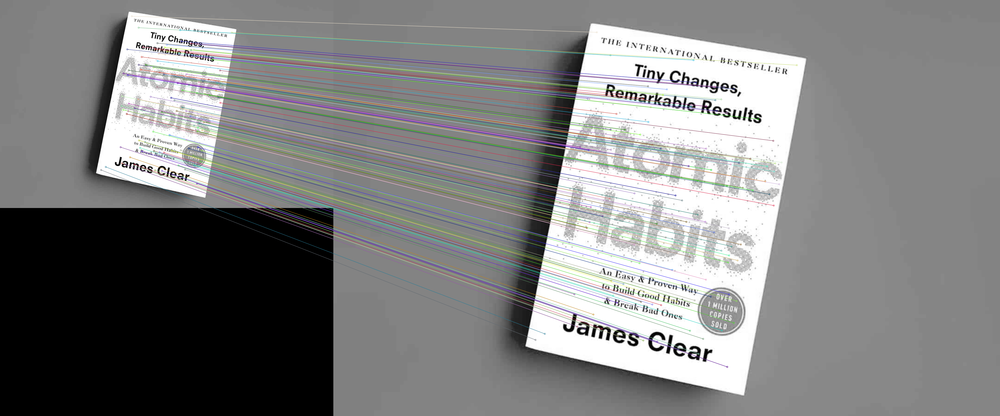

True

In [35]:
# Reading the image
img = cv2.imread('Atomic_habits.jpg')

## SCALING Transformation :
img_scale = cv2.resize(img, None, fx = 2, fy = 2, interpolation = cv2.INTER_LINEAR)

# Making both images Grayscale
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img_scale = cv2.cvtColor(img_scale, cv2.COLOR_BGR2GRAY)


## SIFT(Scale-Invariant Feature Transform) Algorithm :

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Detect keypoints and descriptors
keypoints1, descriptors1 = sift.detectAndCompute(img, None)
keypoints2, descriptors2 = sift.detectAndCompute(img_scale, None)

# Initialize BFMatcher with cross-check = False to use KNN matcher
# Euclidean distance(cv2.NORM_L2): L2 norm measures the straight-line distance between two points in multidimensional space.
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck= False)

# For high accuracy in detecting matchpoint we will use KNN match with ratio test to improve the accuracy.
# Perform KNN matching with k=2 to apply the ratio test :
matches = bf.knnMatch(descriptors1, descriptors2, k=2)

# Ratio test: It ensures that the distance of the best match is significantly smaller than the second-best
# to filter out weak matches and retain only strong matches.
good_matches = []
ratio_threshold = 0.75  # Standard ratio threshold
for m,n in matches:
  if m.distance / n.distance < ratio_threshold:
    good_matches.append(m)

# Sort good matches by distance
good_matches = sorted(good_matches, key = lambda x : x.distance)


# Drawing the matches : 150 matches
matches_draw = cv2.drawMatches(img, keypoints1, img_scale, keypoints2, good_matches[:150], None, flags = cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS )

# Display image
cv2_imshow (matches_draw)  # Google colab

# Saving image
cv2.imwrite('scale_Atomic_habits.jpg', matches_draw)


# Uncomment the following line if running in a Jupyter notebook
# cv2.imshow('Matches', matches_draw)  # for displaying in  jupyter notebook
# cv2.waitKey(0)
# cv2.destroyAllWindows()

## 2. Translation Transformation

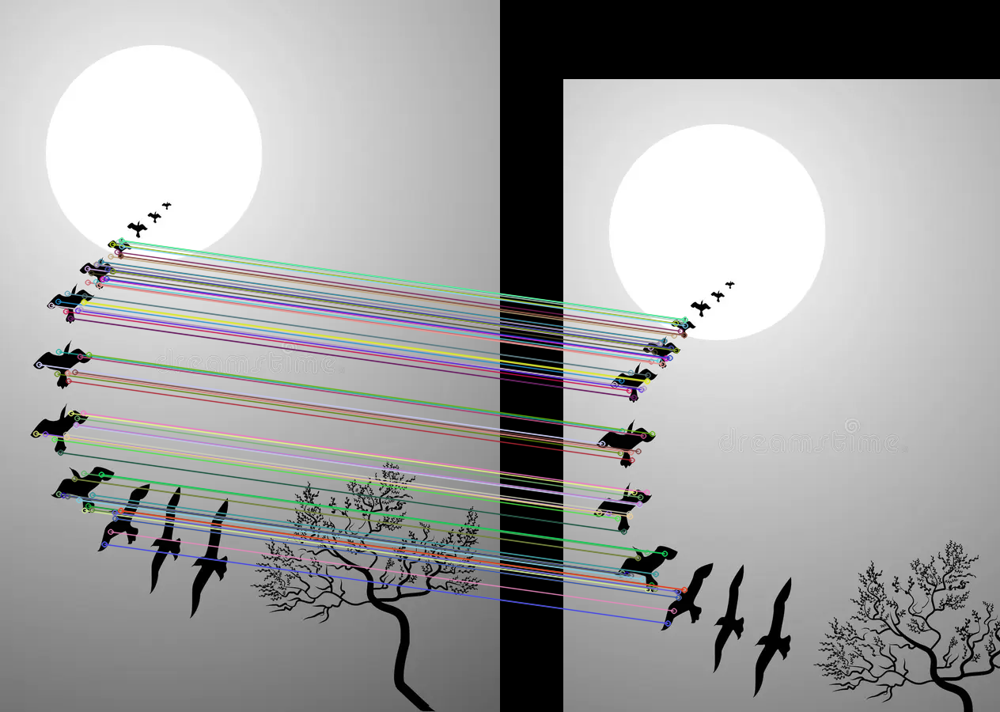

True

In [36]:
# Reading the image
img = cv2.imread('birds.webp')

## TRANSLATION Transformation :

# Translation matrix: shifts right by 80 and down by 100
matrix = np.float32([[1,0,80],[0,1,100]])

# Applying Translation
img_trans = cv2.warpAffine(img, matrix, (img.shape[1], img.shape[0]))  #Shift right by 80 and down by 100

# Convert both images to gray
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img_trans = cv2.cvtColor(img_trans, cv2.COLOR_BGR2GRAY)


## SIFT (Scale-Invariant Feature Transform) Algorithm :

# Detect keypoints and descriptors
keypoints1, descriptors1 = sift.detectAndCompute(img, None)
keypoints2, descriptors2 = sift.detectAndCompute(img_trans, None)

# Translation does not distort keypoint descriptors as much,
# cross-checking approach will also give good results.

# Match descriptors with bf matcher
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(descriptors1, descriptors2)

# Sort good matches by  distance:
good_matches = sorted(matches, key = lambda x : x.distance)

# Draw the matches : 100 matches
matches_draw = cv2.drawMatches(img, keypoints1, img_trans, keypoints2, good_matches[:100], None, flags = cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS )

# Display image
cv2_imshow(matches_draw) # Google colab

# Saving image
cv2.imwrite('Translate_birds.jpg',matches_draw)

# Uncomment the following line if running in a Jupyter notebook
# cv2.imshow('Matches', matches_draw)  # for displaying in  jupyter notebook
# cv2.waitKey(0)
# cv2.destroyAllWindows()


## 3. Rotation Transformation

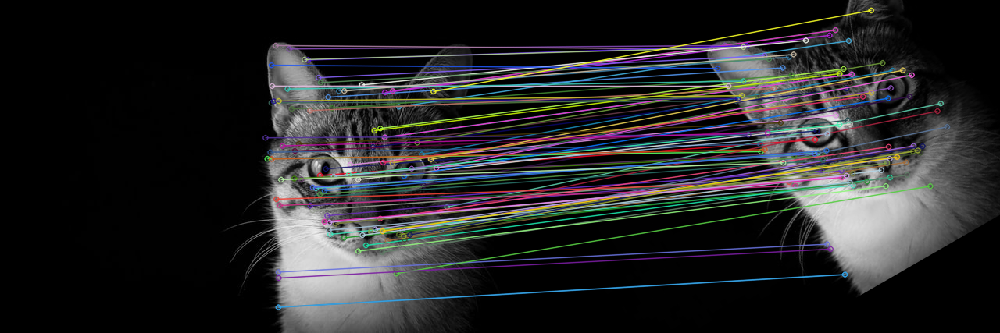

True

In [37]:
# Reading the image
img = cv2.imread('cat.jpg')

# Getting the height and width of image
h, w = img.shape[:2]

## Rotation Transformation :

# Rotation matrix: rotates the image 30 degrees around the center
matrix = cv2.getRotationMatrix2D((w / 2, h / 2), 30, 1)

# Rotating the image :
img_rot = cv2.warpAffine(img, matrix, (w, h))

# Convert both images to grayscale
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img_rot = cv2.cvtColor(img_rot, cv2.COLOR_BGR2GRAY)


## SIFT (Scale-Invariant Feature Transform) Algorithm

# Detect keypoints and descriptors
keypoints1, descriptors1 = sift.detectAndCompute(img, None)
keypoints2, descriptors2 = sift.detectAndCompute(img_rot, None)

# Initialize BFMatcher with cross-check = False to use KNN matcher
# Euclidean distance(cv2.NORM_L2): L2 norm measures the straight-line distance between two points in multidimensional space.
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)

# Perform KNN matching with k=2 and apply ratio test
knn_matches = bf.knnMatch(descriptors1, descriptors2, k=2)

# Apply the ratio test to filter good matches
good_matches = []
ratio_threshold = 0.75  # Standard ratio threshold
for m, n in knn_matches:
    if m.distance/n.distance  < ratio_threshold :
        good_matches.append(m)

# Sort good matches by distance
good_matches = sorted(good_matches, key=lambda x: x.distance)

# Draw the matches : 100 matches
matches_draw = cv2.drawMatches(img, keypoints1, img_rot, keypoints2,  good_matches[:100], None, flags = cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS )

# Display image
cv2_imshow(matches_draw)  # Google colab

# Saving image
cv2.imwrite('Rotate_cat.jpg', matches_draw)

# Uncomment the following line if running in a Jupyter notebook
# cv2.imshow('Matches', matches_draw)  # for displaying in  jupyter notebook
# cv2.waitKey(0)
# cv2.destroyAllWindows()


## 4. Shearing Transformation

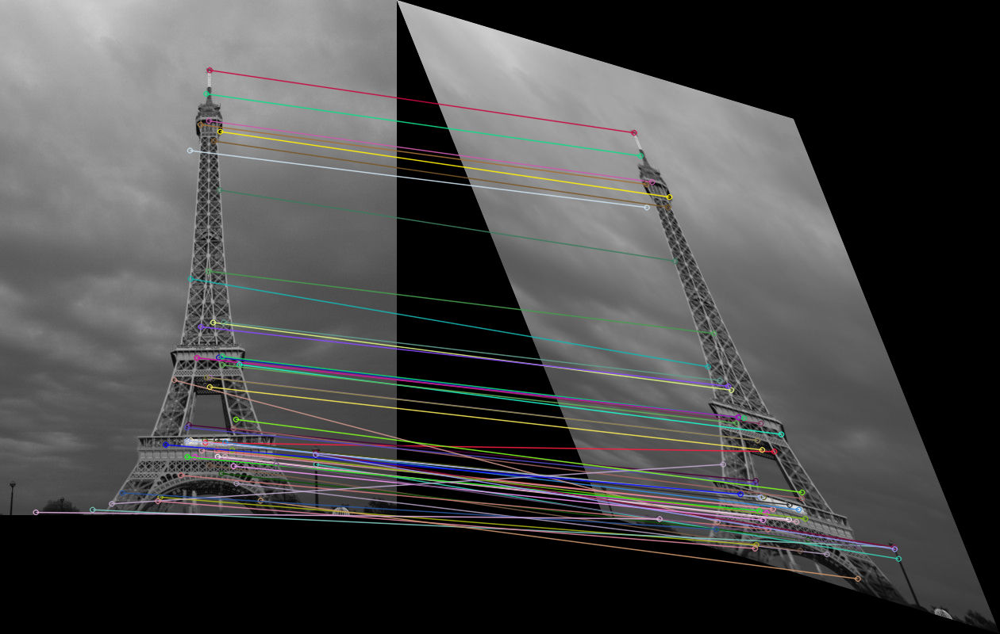

True

In [38]:
# Reading the image
img = cv2.imread('Tower.jpg')

# Getting height and width of image
h, w = img.shape[:2]

## Shearing Transformation :

# Shearing parameters
a = 0.4   # Shearing factor along the x-axis
b = 0.3   # Shearing factor along the y-axis

# Shearing matrix
matrix = np.float32([[1, a, 0], [b, 1, 0]])

# Calculate new width and height dimensions to cover the image inside the canvas
new_w = int(w + h *a)
new_h = int(h + w *b)

# Shearing the image
img_shear = cv2.warpAffine(img, matrix, (new_w, new_h))

# Convert images to grayscale
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img_shear = cv2.cvtColor(img_shear, cv2.COLOR_BGR2GRAY)


## SIFT (Scale-Invariant Feature Transform) Algorithm :

# Detect and compute keypoints and descriptors for both images
keypoints1, descriptors1 = sift.detectAndCompute(img, None)
keypoints2, descriptors2 = sift.detectAndCompute(img_shear, None)

# Initialize BFMatcher with Euclidean distance(cv2.NORM_L2): L2 norm measures the straight-line distance between two points in multidimensional space.
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)

# Perform KNN matching with k=2
knn_matches = bf.knnMatch(descriptors1, descriptors2, k=2)

# Apply the ratio test to filter good matches
good_matches = []
ratio_threshold = 0.75  # Standard ratio threshold
for m, n in knn_matches:
    if m.distance / n.distance < ratio_threshold:
        good_matches.append(m)

# Sort good matches by distance for better visualization
good_matches = sorted(good_matches, key = lambda x : x.distance)

# Draw the matches : 100 matches
matches_draw = cv2.drawMatches(img, keypoints1, img_shear, keypoints2, good_matches[:100], None, flags = cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS )

# Display image
cv2_imshow(matches_draw)  # Google colab

# Saving image
cv2.imwrite('Shear_Tower.jpg', matches_draw)

# Uncomment the following line if running in a Jupyter notebook
# cv2.imshow('Matches', matches_draw)  # for displaying in  jupyter notebook
# cv2.waitKey(0)
# cv2.destroyAllWindows()


## 5. More usage of SIFT detector

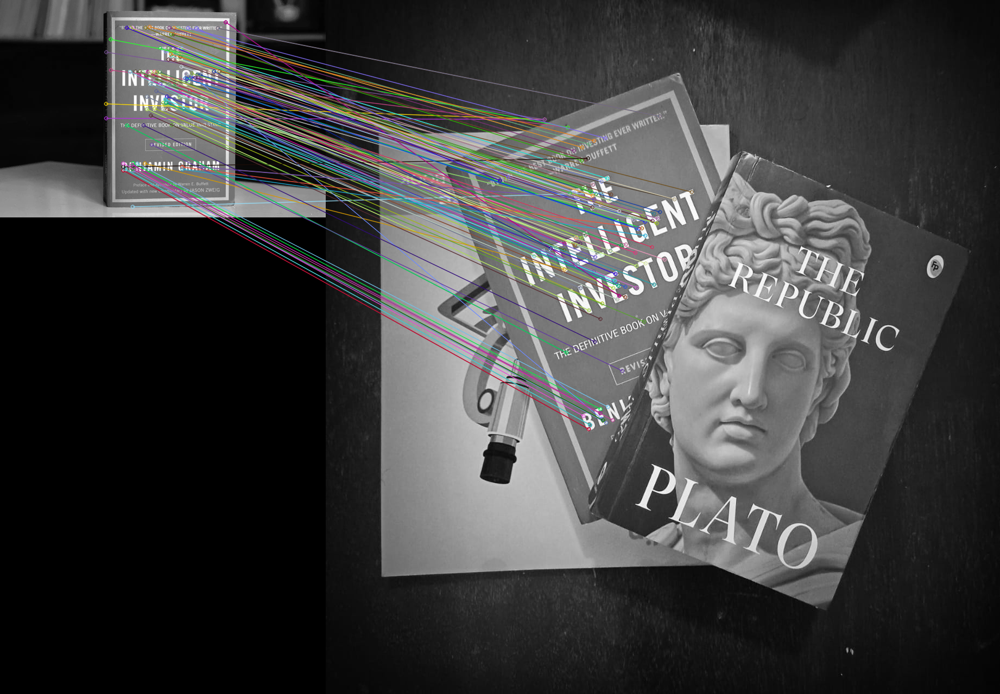

True

In [39]:
## Using SIFT Detector to Find Objects Under Different Conditions (Lighting, Exposure, Cropped, Partially Visible, etc.)

# Reading the image
img1 =  cv2.imread('Intellegent_investor.webp')
img2 = cv2.imread('LotOfBooks.jpeg')

# Converting images to grayscale
img1_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)


## SIFT (Scale-Invariant Feature Transform) Algorithm :

# Finding keypoints and descriptors
keypoints1, descriptors1 = sift.detectAndCompute(img1_gray, None)
keypoints2, descriptors2 = sift.detectAndCompute(img2_gray, None)

# Initialize BFMatcher with Euclidean distance(cv2.NORM_L2): L2 norm measures the straight-line distance between two points in multidimensional space.
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck = False)

# Perform KNN matching with K = 2 and apply ratio test
knn_matches = bf.knnMatch(descriptors1, descriptors2, k=2)

# Apply the ratio test to filter good matches
good_matches = []
ratio_threshold = 0.75  # Standard ratio of threshold

for m,n in knn_matches :
  if m.distance/n.distance < ratio_threshold:
    good_matches.append(m)

# Sort good matches by distance
good_matches = sorted(good_matches, key = lambda x : x.distance)

# Drawing the matches
matches_draw = cv2.drawMatches(img1_gray, keypoints1, img2_gray, keypoints2, good_matches[:150], None, flags = cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS )

# Display image
cv2_imshow(matches_draw)  # Google colab

# Saving the image
cv2.imwrite('Foundpoints.jpg',matches_draw)

# Uncomment the following line if running in a Jupyter notebook
# cv2.imshow('Matches', matches_draw)  # for displaying in  jupyter notebook
# cv2.waitKey(0)
# cv2.destroyAllWindows()
